# Расчет числа Лемтюгова и анализ игроков КХЛ

## Цель проекта:
Создать аналог числа Эрдёша — Бэйкона для отечественных хоккеистов, называемый числом, чтобы измерять "близость" хоккеистов к Николаю Лемтюгову через команды, в которых они играли.

## Задачи проекта:
   1. Собрать данные об отечественных хоккеистах и командах, в которых они играли.
   2. Рассчитать число Лемтюгова для каждого хоккеиста.
   3. Построить дэшборд или отчет с графами, отображающими связи между хоккеистами и количеством команд, через которые они были связаны.

**Гипотезы для проверки:**

1. У Николая Лемтюгова больше всего одноклубников в новейшей российской хоккейной истории. Найти самого популярного хоккеиста или хоккеистов, если это не так.
2. Любые два хоккеиста в истории КХЛ могут познакомиться за максимум 6 рукопожатий.
3. Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше.
4. Нет игроков, у которых отсутствует число Лемтюгова (нет связей через других игроков)?
5. У хоккеистов из северных городов карьера сложилась более успешно, чем у южан.
6. Более успешные хоккеисты рождаются в январе-марте.

**Ход исследования:**

* Исследование и предобработка данных;
* Объединение сырых данные в чистые, рабочие таблицы;
* Рассчет числа Лемтюгова для каждого хоккеиста;
* Проверка гипотез;
* Подготовка дашборда;
* Выводы по проведенному исследованию.

**Для работы были представленны следующие датасеты:**

* players_data.csv - датасет из всех игроков, заигранных за команды КХЛ, начиная с сезона 2008-2009. Данные с сайта eliteprospects.com.
* transfers.csv - датасет всех переходов игроков из всех лиг, первый трансфер 14/12/2007. Данные с сайта eliteprospects.com.
* players_personal_data - датасет с личными данными игроков
* player_stats - датасет со статистикой игроков


# Оглавление
1. [Выгрузка данных, общая информация и предобработка](#start)
    * [Изучение и предобработка players_data.csv](#players)
    * [Изучение и предобработка transfers.csv](#transfers)
    * [Изучение и предобработка players_personal_data.csv](#personal)
    * [Изучение и предобработка player_stats.csv](#stat)
    * [Результаты предобработки](#results)
2. [Объединение данных в рабочие таблицы](#correct)
    * [Трансферы и клубы ](#transfers_clear)
    * [Игроки и их позиции](#player_type)
3. [Рассчет числа Лемтюгова для каждого хоккеиста ](#lem)
    * [Визуализация граф](#graph)
    * [Диаграмма Санкей по трансферам игроков](#sankey)
4. [Гипотезы для проверки](#test)
    * [ У Николая Лемтюгова больше всего одноклубников в новейшей российской хоккейной истории.](#new_history)
    * [Любые два хоккеиста в истории КХЛ могут познакомиться за максимум 6 рукопожатий](#six_shakes)
    * [Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше](#max_low)
    * [Нет игроков, у которых отсутствует число Лемтюгова](#no_lem)
    * [У хоккеистов из северных городов карьера сложилась более успешно, чем у южан](#north_south)
    * [Более успешные хоккеисты рождаются в январе-марте](#birthday)
5. [Заключение](#final)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
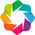

In [1]:
import pandas as pd
import datetime as dt
from datetime import timedelta
import numpy as np

#Библиотека для парсинга json
import json

#Основные графические библиотеки
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


#Библиотека визуализации bokeh и фронтенд для вывода - holoviews
import holoviews as hv
import bokeh
from holoviews import opts, dim
import holoviews.plotting.bokeh
from bokeh.plotting import show, output_file
hv.extension('bokeh')

#request - чтобы подтягивать информацию с других сайтов - используется в функции отрисовки sankey чарта
import requests

#Для отображения прогресса - используется в функции отрисовки sankey чарта
from tqdm import tqdm

import networkx as nx

#Для геоаналитики
!pip install folium --quiet
!pip install jupyterlab-geojson --quiet
!pip install geopandas --quiet

import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import geopandas as gpd

sns.set(style="whitegrid")
sns.set_palette(sns.color_palette("deep"))

## Выгрузка данных, общая информация и предобработка <a class="anchor" id="start"></a>

В нашем распоряжении четыре датасета: players_data.csv, transfers.csv, players_personal_data.csv и player_stats.csv. Загрузим имеющиеся данные и посмотрим что содержится в таблицах, информацию о хранимых типах данных, если ли пропуски и явные дубликаты и проведем предобработку при необходимости

### Изучение и предобработка players_data.csv <a class="anchor" id="players"></a>

In [2]:
players_data = pd.read_csv('https://raw.githubusercontent.com/CurasaoRG/hockey_project/main/players_data.csv')

display(players_data.info())

columns_with_miss = players_data.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print ('Колонок с пропущенным значением:', len(columns_with_miss))
columns_with_miss.sort_values(ascending=False)
print ('Количество явных дубликатов:', players_data.duplicated().sum())
players_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14332 entries, 0 to 14331
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Team           14332 non-null  object 
 1   Season         14332 non-null  object 
 2   Player         14332 non-null  object 
 3   Player_number  14332 non-null  int64  
 4   Position       14332 non-null  object 
 5   Captain        1037 non-null   object 
 6   Born           14332 non-null  int64  
 7   Birthplace     14271 non-null  object 
 8   Age            14234 non-null  float64
 9   Height         14332 non-null  int64  
 10  Weight         14332 non-null  int64  
 11  Stick          14332 non-null  object 
 12  Player_link    14332 non-null  object 
dtypes: float64(1), int64(4), object(8)
memory usage: 1.4+ MB


None

Колонок с пропущенным значением: 3
Количество явных дубликатов: 0


,Team,Season,Player,Player_number,Position,Captain,Born,Birthplace,Age,Height,Weight,Stick,Player_link
0,Salavat Yulaev Ufa,2008-2009,Sergei Belov,31,G,NaN,1982,"St. Petersburg, RUS",40.0,180,78,L,https://www.eliteprospects.com/player/19555/se...
1,Salavat Yulaev Ufa,2008-2009,Rafael Khakimov,31,G,NaN,1990,"Ufa, RUS",33.0,180,78,L,https://www.eliteprospects.com/player/47547/ra...
2,Salavat Yulaev Ufa,2008-2009,Vadim Tarasov,1,G,NaN,1976,"Ust-Kamenogorsk, KAZ",46.0,183,84,L,https://www.eliteprospects.com/player/11990/va...
3,Salavat Yulaev Ufa,2008-2009,Alexander Yeryomenko,30,G,NaN,1980,"Moskva, RUS",43.0,180,78,L,https://www.eliteprospects.com/player/12286/al...
4,Salavat Yulaev Ufa,2008-2009,Miroslav Blatak,23,D,NaN,1982,"Zlin, CZE",41.0,180,78,L,https://www.eliteprospects.com/player/8421/mir...


Датасет содержит базовую информацию о игроках: клуб, сезон, ФИО, игровые и физические данные и информация о месте и году рождения.

Пропуски содержат столбцы со статусом капитана (заполнены только у капитанов), месте рождения и возрасте. Судя по году рождения, возраст игроков указан на день выгрузки, а не на момент сезона. Заполним их с помощью вычитания года рождения от текущего дня

In [3]:
players_data.columns = players_data.columns.str.lower()

In [4]:
players_data['age'] = players_data['age'].fillna(2023 - players_data['born'])

In [5]:
display(players_data['age'].info())

<class 'pandas.core.series.Series'>
RangeIndex: 14332 entries, 0 to 14331
Series name: age
Non-Null Count  Dtype  
--------------  -----  
14332 non-null  float64
dtypes: float64(1)
memory usage: 112.1 KB


None

Пропски заполнены. Можно перейти к следующему датасету

### Изучение и предобработка transfers.csv <a class="anchor" id="transfers"></a>

In [6]:
transfers = pd.read_csv('https://raw.githubusercontent.com/CurasaoRG/hockey_project/main/transfers.csv')

display(transfers.info())

columns_with_miss = transfers.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print ('Колонок с пропущенным значением:', len(columns_with_miss))
columns_with_miss.sort_values(ascending=False)
print ('Количество явных дубликатов:', transfers.duplicated().sum())
transfers.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167125 entries, 0 to 167124
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Date            167125 non-null  object
 1   Player          167125 non-null  object
 2   Player_link     167125 non-null  object
 3   From_team       167125 non-null  object
 4   From_team_link  158148 non-null  object
 5   To_team         167125 non-null  object
 6   To_team_link    156866 non-null  object
dtypes: object(7)
memory usage: 8.9+ MB


None

Колонок с пропущенным значением: 2
Количество явных дубликатов: 7


,Date,Player,Player_link,From_team,From_team_link,To_team,To_team_link
0,05/06/2023,Stefan Warg,https://www.eliteprospects.com/player/6870/ste...,HC Sparta Praha,https://www.eliteprospects.com/team/164/hc-spa...,Unknown,NaN
1,05/06/2023,Patrik Romancik,https://www.eliteprospects.com/player/102395/p...,Vlci Zilina,https://www.eliteprospects.com/team/1162/vlci-...,VHK Vsetín,https://www.eliteprospects.com/team/5337/vhk-v...
2,05/06/2023,Paul Stanley,https://www.eliteprospects.com/player/119679/p...,Solihull Barons,https://www.eliteprospects.com/team/1525/solih...,Retired,NaN
3,05/06/2023,Marcus Maynard,https://www.eliteprospects.com/player/122841/m...,Solihull Barons,https://www.eliteprospects.com/team/1525/solih...,Retired,NaN
4,05/06/2023,Sam Hewitt,https://www.eliteprospects.com/player/156284/s...,Solihull Barons,https://www.eliteprospects.com/team/1525/solih...,Retired,NaN


Таблица содержит дату перехода игроков из одного клуба в другой (переход может быть как в другой клуб, так и выход на пенсию, как видно из первых пяти значений). В данных информацию не только о клубах КХЛ, поэтому в дальнейшем нужно будет ограничить данные только теми игроками, которые хотя бы сезон отыграли в КХЛ.

Пропуски содержатся. колонке с сылками на команд перехода. Они никак не повлияют на наше исследование, следовательно нет смысла их заполнять.

Удалим явные дубликаты, приведем колонку Date к нужному типу и оставим только необходимые данные.

In [7]:
transfers.columns = transfers.columns.str.lower()

In [8]:
transfers = transfers.drop_duplicates()

In [9]:
transfers['date'] = transfers['date'].map(
    lambda x: dt.datetime.strptime(x, '%d/%m/%Y')
)

In [10]:
transfers = transfers[['date', 'player_link', 'player', 'from_team', 'to_team']]

In [11]:
display(transfers.info())
print ('Количество явных дубликатов:', transfers.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167118 entries, 0 to 167124
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   date         167118 non-null  datetime64[ns]
 1   player_link  167118 non-null  object        
 2   player       167118 non-null  object        
 3   from_team    167118 non-null  object        
 4   to_team      167118 non-null  object        
dtypes: datetime64[ns](1), object(4)
memory usage: 7.7+ MB


None

Количество явных дубликатов: 0


Дубликаты удалены, Date приведен к нужному типу данных. Можно перейти к следующему датасету

### Изучение и предобработка players_personal_data.csv <a class="anchor" id="personal"></a>

In [12]:
personal = pd.read_csv('https://raw.githubusercontent.com/CurasaoRG/hockey_project/main/players_personal_data.csv')

display(personal.info())

columns_with_miss = personal.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print ('Колонок с пропущенным значением:', len(columns_with_miss))
columns_with_miss.sort_values(ascending=False)
print ('Количество явных дубликатов:', personal.duplicated().sum())
personal.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3599 entries, 0 to 3598
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Player_name     3599 non-null   object
 1   Date_of_Birth   3599 non-null   object
 2   Position        3599 non-null   object
 3   Age             3599 non-null   object
 4   Place_of_Birth  3599 non-null   object
 5   Nation          3599 non-null   object
 6   Grip            3599 non-null   object
 7   Youth_Team      3599 non-null   object
 8   Height_cm       3599 non-null   int64 
 9   Height_ft       3599 non-null   object
 10  Weight_kg       3599 non-null   int64 
 11  Weight_lbs      3599 non-null   object
 12  Awards          3599 non-null   object
 13  Player_link     3599 non-null   object
dtypes: int64(2), object(12)
memory usage: 393.8+ KB


None

Колонок с пропущенным значением: 0
Количество явных дубликатов: 0


,Player_name,Date_of_Birth,Position,Age,Place_of_Birth,Nation,Grip,Youth_Team,Height_cm,Height_ft,Weight_kg,Weight_lbs,Awards,Player_link
0,Sergei Belov,1982-09-27 00:00:00,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"{""2009-2010"": [""Russia2 Silver Medal""], ""2013-...",https://www.eliteprospects.com/player/19555/se...
1,Rafael Khakimov,1990-04-06 00:00:00,G,33,"Ufa, RUS",Russia,L,Salavat Yulaev Ufa,180,"5'11""",78,172 lbs,"{""2010-2011"": [""MHL All-Star Game"", ""MHL Best ...",https://www.eliteprospects.com/player/47547/ra...
2,Vadim Tarasov,1976-12-31 00:00:00,G,46,"Ust-Kamenogorsk, KAZ",Russia\n \n / \n Kaza...,L,Torpedo Ust-Kamenogorsk,183,"6'0""",84,185 lbs,"{""1998-1999"": [""RSL Best Goaltender""], ""1999-2...",https://www.eliteprospects.com/player/11990/va...
3,Alexander Yeryomenko,1980-04-10 00:00:00,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"{""2004-2005"": [""RSL Champion"", ""World Champion...",https://www.eliteprospects.com/player/12286/al...
4,Miroslav Blatak,1982-05-25 00:00:00,D,41,"Zlin, CZE",Czechia,L,HC Zlin,180,"5'11""",78,172 lbs,"{""2001-2002"": [""Czech Extraliga Bronze Medal"",...",https://www.eliteprospects.com/player/8421/mir...


Датасет содержит персональную информацию о игроках, их позицию, день/место рождения и награды, полученные ими за все время карьеры на дату выгрузки.

Данные полные, не содержат дубликатов. Приведем дату рождения к нужному типу данных

In [13]:
personal.columns = personal.columns.str.lower()

In [14]:
personal['date_of_birth'] = personal['date_of_birth'].apply(
    lambda x: dt.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
)

In [15]:
personal['id'] = personal.player_link.str.split('/', expand=True)[4].astype(int)

In [16]:
display(personal['date_of_birth'].info())

<class 'pandas.core.series.Series'>
RangeIndex: 3599 entries, 0 to 3598
Series name: date_of_birth
Non-Null Count  Dtype         
--------------  -----         
3599 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 28.2 KB


None

### Изучение и предобработка player_stats.csv <a class="anchor" id="stat"></a>

In [17]:
stats = pd.read_csv('https://raw.githubusercontent.com/CurasaoRG/hockey_project/main/players_stats.csv')

display(stats.info())

columns_with_miss = stats.isna().sum()
columns_with_miss = columns_with_miss[columns_with_miss!=0]
print ('Колонок с пропущенным значением:', len(columns_with_miss))
columns_with_miss.sort_values(ascending=False)
print ('Количество явных дубликатов:', stats.duplicated().sum())
stats.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116669 entries, 0 to 116668
Data columns (total 34 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   116669 non-null  int64  
 1   Player_name                  116669 non-null  object 
 2   Season                       116669 non-null  object 
 3   Team                         116669 non-null  object 
 4   League                       116384 non-null  object 
 5   Player_link                  116669 non-null  object 
 6   Regular_Games_Played         112832 non-null  float64
 7   Regular_Goals                99535 non-null   float64
 8   Regular_Assists              99475 non-null   float64
 9   Regular_Total_Points         99474 non-null   float64
 10  Regular_Penalty_Minutes      98700 non-null   float64
 11  Regular_Plus_Minus           75753 non-null   float64
 12  Regular_Games_Dressed        5959 non-null    float64
 13 

None

Колонок с пропущенным значением: 29
Количество явных дубликатов: 0


,Unnamed: 0,Player_name,Season,Team,League,Player_link,Regular_Games_Played,Regular_Goals,Regular_Assists,Regular_Total_Points,...,Postseason_Penalty_Minutes,Postseason_Plus_Minus,Postseason_Games_Dressed,Postseason_GAA,Postseason_Saves_Percentage,Postseason_Goals_Against,Postseason_Saves,Postseason_Shutouts,Postseason_WLT,Postseason_TOI
0,0,Sergei Belov,2000-01,SKASt.Petersburg,Russia,https://www.eliteprospects.com/player/19555/se...,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Sergei Belov,2000-01,SKASt.Petersburg-2,Russia3,https://www.eliteprospects.com/player/19555/se...,25.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Sergei Belov,2001-02,SKASt.Petersburg,Russia,https://www.eliteprospects.com/player/19555/se...,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Sergei Belov,2001-02,SKASt.Petersburg-2,Russia3,https://www.eliteprospects.com/player/19555/se...,25.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Sergei Belov,2001-02,SpartakSt.Petersburg,Russia2,https://www.eliteprospects.com/player/19555/se...,7.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Датасет содержит статистику по игрокам. Большая часть статистики зполнена только для: определенной Роли игрока (полевой или вратарь) и типу игр (регулярные или плей-офф). В остальном днные не требуют предобработки т.к. несмотря на то, что колонка Season выглядит как даты, по факту ей не является.

In [18]:
stats.columns = stats.columns.str.lower()

### Результаты предобработки  <a class="anchor" id="results"></a>

Все данные были проверены и обработаны, если в этом была необходимость.

Были внесены следующие изменения:

*players_data.csv*
* Заполнены пропуски в колонке Age

*transfers.csv*
* Удалены явные дубликаты. Тип данных колонки Date приведен к типу datetime

*players_personal_data.csv*
* Тип данных колонки Date_of_Birth приведен к типу datetime

**Во всех датасетах заголовки были приведены к нижнему регистру**

## Объединение данных в рабочие таблицы <a class="anchor" id="correct"></a>

Сырые данные содержат много информации, в которой нет необходимости в целях нашего исследования. Создадим сводную таблицу, которая будет содержать информацию о трансферах только игроков-участников клубов КХЛ и отдельные табицы игроков по позициям и их персональными данными

### Трансферы и клубы <a class="anchor" id="transfers_clear"></a>

Проверим, что в датасете players_data содержиться информация только о игроках - кубов КХЛ

In [19]:
club_list = players_data['team'].unique()
print('Всего в датасете',players_data['team'].nunique(),'команд')
print('Список команд: ')
club_list

Всего в датасете 40 команд
Список команд: 


array(['Salavat Yulaev Ufa', 'Ak Bars Kazan', 'Atlant Mytishchi',
       'Lokomotiv Yaroslavl', 'CSKA Moskva', 'Metallurg Magnitogorsk',
       'Dynamo Moskva', 'SKA St. Petersburg', 'Spartak Moskva',
       'Dinamo Riga', 'Torpedo Nizhny Novgorod', 'Traktor Chelyabinsk',
       'Lada Togliatti', 'Neftekhimik Nizhnekamsk', 'Barys Astana',
       'Avangard Omsk', 'Severstal Cherepovets', 'HK MVD',
       'Sibir Novosibirsk', 'Amur Khabarovsk', 'Metallurg Novokuznetsk',
       'Dynamo Minsk', 'Vityaz Chekhov', 'Khimik Voskresensk',
       'Avtomobilist Yekaterinburg', 'OHK Dynamo Moskva',
       'Yugra Khanty-Mansiysk', 'Lev Poprad', 'HC Slovan Bratislava',
       'HC Lev Praha', 'Donbass Donetsk', 'Medvescak Zagreb',
       'Admiral Vladivostok', 'Vityaz Podolsk', 'Jokerit', 'Dinamo Minsk',
       'HK Sochi', 'Kunlun Red Star', 'Barys Nur-Sultan',
       'Vityaz Moscow Region'], dtype=object)

Все команды находились в КХЛ в какой то момент времени с 2008 по 2023 год. С этим списком можно будет ограничить перечень трансферов до тех, которые проходили внутри Лиги и исключить лишнюю инормацию.

Возьмем из этого датасета уникальные имена игроков и ссылку, чтобы после ссылаться на них при составлении актуальных для исследования таблиц

In [20]:
khl_players = players_data[['player_link', 'player']]
khl_players = khl_players.drop_duplicates().reset_index(drop=True)
khl_players['id'] = khl_players.player_link.str.split('/', expand=True)[4].astype(int)
khl_players

,player_link,player,id
0,https://www.eliteprospects.com/player/19555/se...,Sergei Belov,19555
1,https://www.eliteprospects.com/player/47547/ra...,Rafael Khakimov,47547
2,https://www.eliteprospects.com/player/11990/va...,Vadim Tarasov,11990
3,https://www.eliteprospects.com/player/12286/al...,Alexander Yeryomenko,12286
4,https://www.eliteprospects.com/player/8421/mir...,Miroslav Blatak,8421
...,...,...,...
3594,https://www.eliteprospects.com/player/595716/y...,Yegor Sobolevsky,595716
3595,https://www.eliteprospects.com/player/649445/r...,Roman Yuzbashyan,649445
3596,https://www.eliteprospects.com/player/418542/s...,Sergei Popov,418542
3597,https://www.eliteprospects.com/player/561884/d...,Dmitri Utkin,561884


In [21]:
id_dic = khl_players[['id', 'player']].to_dict('records')
players_dict = {}
for i in id_dic:
  for k, v in i.items():
    players_dict.update({i['id']: i['player']})

Количество строк совпадает с данными о персональной информацией. Так как ФИО игроков могут совпадать, будем использовать ссылку на страницу с информацией в качестве ID игрока. Очистим таблицу с транферами, оставив только команды КХЛ

In [22]:
transfers_clear =  transfers.query('to_team in @club_list \
                                    and from_team in @club_list').reset_index(drop=True)
transfers_clear = transfers_clear[['date', 'player', 'player_link', 'from_team', 'to_team']]

In [23]:
transfers_clear.head()

,date,player,player_link,from_team,to_team
0,2023-06-05,Vadim Nikitin,https://www.eliteprospects.com/player/273056/v...,Lada Togliatti,Admiral Vladivostok
1,2023-06-05,Danila Kvartalnov,https://www.eliteprospects.com/player/265483/d...,Spartak Moskva,Metallurg Magnitogorsk
2,2023-06-05,Nikolay Goldobin,https://www.eliteprospects.com/player/160550/n...,Metallurg Magnitogorsk,Spartak Moskva
3,2023-06-04,Denis Vengryzhanovsky,https://www.eliteprospects.com/player/512711/d...,Torpedo Nizhny Novgorod,Avangard Omsk
4,2023-06-02,Ivan Mischenko,https://www.eliteprospects.com/player/235902/i...,Barys Astana,Amur Khabarovsk


За все время с 2008 года было совершено 4267 перехода внутри КХЛ.
Дополнительно создадим таблицу, которая будет содержать информацию о составе команд в определенный сезон

In [24]:
khl_data = players_data.query('team in @club_list').reset_index(drop=True)
khl_data = khl_data[['player_link', 'player', 'team', 'season']]
khl_data.head()

,player_link,player,team,season
0,https://www.eliteprospects.com/player/19555/se...,Sergei Belov,Salavat Yulaev Ufa,2008-2009
1,https://www.eliteprospects.com/player/47547/ra...,Rafael Khakimov,Salavat Yulaev Ufa,2008-2009
2,https://www.eliteprospects.com/player/11990/va...,Vadim Tarasov,Salavat Yulaev Ufa,2008-2009
3,https://www.eliteprospects.com/player/12286/al...,Alexander Yeryomenko,Salavat Yulaev Ufa,2008-2009
4,https://www.eliteprospects.com/player/8421/mir...,Miroslav Blatak,Salavat Yulaev Ufa,2008-2009


Проверим какие сезоны присутствуют в датасете и Добавим к сезону дату старта и дату конца, которую мы узнали из внешних источников

In [25]:
khl_data['season'].unique()

array(['2008-2009', '2009-2010', '2010-2011', '2011-2012', '2012-2013',
       '2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018',
       '2018-2019', '2019-2020', '2020-2021', '2021-2022', '2022-2023'],
      dtype=object)

In [26]:
from datetime import datetime

season_dates_khl = pd.DataFrame({'season': ['2008-2009', '2009-2010', '2010-2011', '2011-2012','2012-2013','2013-2014',
                              '2014-2015', '2015-2016', '2016-2017', '2017-2018', '2018-2019','2019-2020',
                              '2020-2021', '2021-2022', '2022-2023']
                   ,
                   'start_date': [datetime(2008, 9, 2), datetime(2009, 9, 10), datetime(2010, 9, 8),
                                 datetime(2011, 9, 7), datetime(2012, 9, 4), datetime(2013, 9, 4),
                                 datetime(2014, 8, 25), datetime(2015, 8, 24), datetime(2016, 8, 22),
                                 datetime(2017, 8, 21), datetime(2018, 9, 1), datetime(2019, 9, 1),
                                 datetime(2020, 9, 2), datetime(2021, 9, 1), datetime(2022, 9, 1)
                                 ]
                  ,
                   'end_date': [datetime(2009, 4, 12), datetime(2010, 4, 22), datetime(2011, 4, 20),
                                 datetime(2012, 4, 29), datetime(2013, 6, 24), datetime(2014, 4, 30),
                                 datetime(2015, 4, 30), datetime(2016, 4, 19), datetime(2017, 4, 16),
                                 datetime(2018, 4, 19), datetime(2019, 4, 19), datetime(2020, 3, 12),
                                 datetime(2021, 5, 7), datetime(2022, 4, 30), datetime(2023, 4, 29)
                                 ]})
season_dates_khl

,season,start_date,end_date
0,2008-2009,2008-09-02,2009-04-12
1,2009-2010,2009-09-10,2010-04-22
2,2010-2011,2010-09-08,2011-04-20
3,2011-2012,2011-09-07,2012-04-29
4,2012-2013,2012-09-04,2013-06-24
5,2013-2014,2013-09-04,2014-04-30
6,2014-2015,2014-08-25,2015-04-30
7,2015-2016,2015-08-24,2016-04-19
8,2016-2017,2016-08-22,2017-04-16
9,2017-2018,2017-08-21,2018-04-19


In [27]:
#Код ревьюера - присоединяем информацию о датах сезона по ключу словаря
seasons_khl = {
    '2008-2009': (datetime(2008, 9, 2), datetime(2009, 4, 12)),
    '2009-2010': (datetime(2009, 9, 10), datetime(2010, 4, 22)),
    '2010-2011': (datetime(2010, 9, 8), datetime(2011, 4, 20)),
    '2011-2012': (datetime(2011, 9, 7), datetime(2012, 4, 29)),
    '2012-2013': (datetime(2012, 9, 4), datetime(2013, 4, 17)),
    '2013-2014': (datetime(2013, 9, 4), datetime(2014, 4, 30)),
    '2014-2015': (datetime(2014, 8, 25), datetime(2015, 4, 30)),
    '2015-2016': (datetime(2015, 8, 24), datetime(2016, 4, 19)),
    '2016-2017': (datetime(2016, 8, 22), datetime(2017, 4, 16)),
    '2017-2018': (datetime(2017, 8, 21), datetime(2018, 4, 19)),
    '2018-2019': (datetime(2018, 9, 1), datetime(2019, 4, 19)),
    '2019-2020': (datetime(2019, 9, 1), datetime(2020, 3, 12)),
    '2020-2021': (datetime(2020, 9, 2), datetime(2021, 5, 7)),
    '2021-2022': (datetime(2021, 9, 1), datetime(2022, 4, 30)),
    '2022-2023': (datetime(2022, 9, 1), datetime(2023, 4, 29))
}
#Дата начала сезона
khl_data['season'].map(seasons_khl).str[0]
#Дата конца сезона
khl_data['season'].map(seasons_khl).str[1]

0        2009-04-12 00:00:00
1        2009-04-12 00:00:00
2        2009-04-12 00:00:00
3        2009-04-12 00:00:00
4        2009-04-12 00:00:00
                ...         
14327    2023-04-29 00:00:00
14328    2023-04-29 00:00:00
14329    2023-04-29 00:00:00
14330    2023-04-29 00:00:00
14331    2023-04-29 00:00:00
Name: season, Length: 14332, dtype: object

In [28]:
season_khl = pd.merge(khl_data, season_dates_khl, on=['season'], how='inner')
season_khl.head()

,player_link,player,team,season,start_date,end_date
0,https://www.eliteprospects.com/player/19555/se...,Sergei Belov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12
1,https://www.eliteprospects.com/player/47547/ra...,Rafael Khakimov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12
2,https://www.eliteprospects.com/player/11990/va...,Vadim Tarasov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12
3,https://www.eliteprospects.com/player/12286/al...,Alexander Yeryomenko,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12
4,https://www.eliteprospects.com/player/8421/mir...,Miroslav Blatak,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12


In [29]:
transfers_clear.head()

,date,player,player_link,from_team,to_team
0,2023-06-05,Vadim Nikitin,https://www.eliteprospects.com/player/273056/v...,Lada Togliatti,Admiral Vladivostok
1,2023-06-05,Danila Kvartalnov,https://www.eliteprospects.com/player/265483/d...,Spartak Moskva,Metallurg Magnitogorsk
2,2023-06-05,Nikolay Goldobin,https://www.eliteprospects.com/player/160550/n...,Metallurg Magnitogorsk,Spartak Moskva
3,2023-06-04,Denis Vengryzhanovsky,https://www.eliteprospects.com/player/512711/d...,Torpedo Nizhny Novgorod,Avangard Omsk
4,2023-06-02,Ivan Mischenko,https://www.eliteprospects.com/player/235902/i...,Barys Astana,Amur Khabarovsk


Чтобы в дальнейшем объеденить таблицы трансферов с таблицей игроков по сезону создадим два столбца
1) team - как текущая команда, в которой игрок оказался после перехода  
2) season - в котором определим к какому сезону относился трансфер

Так как часть переходов могли проходить вне сезона, сделаем функцю, которая автоматически определит все такие переходы в предстоящий сезон

In [30]:
transfers_clear['team'] = transfers_clear['to_team']

In [31]:
def season(x):
    if x < pd.to_datetime('2009-04-12'):
        return '2008-2009'
    elif x <= pd.to_datetime('2010-04-22'):
        return '2009-2010'
    elif x <= pd.to_datetime('2011-04-20'):
        return '2010-2011'
    elif x <= pd.to_datetime('2012-04-29'):
        return '2011-2012'
    elif x <= pd.to_datetime('2013-06-24'):
        return '2012-2013'
    elif x <= pd.to_datetime('2014-04-30'):
        return '2013-2014'
    elif x <= pd.to_datetime('2015-04-30'):
        return '2014-2015'
    elif x <= pd.to_datetime('2016-04-19'):
        return '2015-2016'
    elif x <= pd.to_datetime('2017-04-16'):
        return '2016-2017'
    elif x <= pd.to_datetime('2018-04-19'):
        return '2017-2018'
    elif x <= pd.to_datetime('2019-04-19'):
        return '2018-2019'
    elif x <= pd.to_datetime('2020-03-12'):
        return '2019-2020'
    elif x <= pd.to_datetime('2021-05-07'):
        return '2020-2021'
    elif x <= pd.to_datetime('2022-04-30'):
        return '2021-2022'
    elif x <= pd.to_datetime('2023-04-29'):
        return '2022-2023'
    else:
        return '2023-2024'

transfers_clear['season'] = transfers_clear['date'].apply(season)

transfers_clear

,date,player,player_link,from_team,to_team,team,season
0,2023-06-05,Vadim Nikitin,https://www.eliteprospects.com/player/273056/v...,Lada Togliatti,Admiral Vladivostok,Admiral Vladivostok,2023-2024
1,2023-06-05,Danila Kvartalnov,https://www.eliteprospects.com/player/265483/d...,Spartak Moskva,Metallurg Magnitogorsk,Metallurg Magnitogorsk,2023-2024
2,2023-06-05,Nikolay Goldobin,https://www.eliteprospects.com/player/160550/n...,Metallurg Magnitogorsk,Spartak Moskva,Spartak Moskva,2023-2024
3,2023-06-04,Denis Vengryzhanovsky,https://www.eliteprospects.com/player/512711/d...,Torpedo Nizhny Novgorod,Avangard Omsk,Avangard Omsk,2023-2024
4,2023-06-02,Ivan Mischenko,https://www.eliteprospects.com/player/235902/i...,Barys Astana,Amur Khabarovsk,Amur Khabarovsk,2023-2024
...,...,...,...,...,...,...,...
4262,2009-04-22,Pavel Vorobiev,https://www.eliteprospects.com/player/9561/pav...,Severstal Cherepovets,HK MVD,HK MVD,2009-2010
4263,2009-04-20,Gennady Stolyarov,https://www.eliteprospects.com/player/13646/ge...,Barys Astana,HK MVD,HK MVD,2009-2010
4264,2009-04-14,Mikko Jokela,https://www.eliteprospects.com/player/2674/mik...,Jokerit,Dynamo Minsk,Dynamo Minsk,2009-2010
4265,2009-01-15,Georgijs Pujacs,https://www.eliteprospects.com/player/4053/geo...,Lada Togliatti,Dinamo Riga,Dinamo Riga,2008-2009


Объеденим таблицу с трансферами и таблицу с игроками по сезонам. Для этого используем колонки с именем игрока, сезоном, командой и ссылкой на игрока, чтобы избежать дубликатов и не удалить случайно тесок

In [32]:
season_transfer = pd.merge(season_khl, transfers_clear, on=['player',
                                                            'season',
                                                            'team',
                                                            'player_link'], how='left').reset_index(drop=True)

In [33]:
season_transfer['id'] = season_transfer.player_link.str.split('/', expand=True)[4].astype(int)

In [34]:
season_transfer

,player_link,player,team,season,start_date,end_date,date,from_team,to_team,id
0,https://www.eliteprospects.com/player/19555/se...,Sergei Belov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,19555
1,https://www.eliteprospects.com/player/47547/ra...,Rafael Khakimov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,47547
2,https://www.eliteprospects.com/player/11990/va...,Vadim Tarasov,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,11990
3,https://www.eliteprospects.com/player/12286/al...,Alexander Yeryomenko,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,12286
4,https://www.eliteprospects.com/player/8421/mir...,Miroslav Blatak,Salavat Yulaev Ufa,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,8421
...,...,...,...,...,...,...,...,...,...,...
14331,https://www.eliteprospects.com/player/75331/ni...,Nikita Tochitsky,HK Sochi,2022-2023,2022-09-01,2023-04-29,NaT,NaN,NaN,75331
14332,https://www.eliteprospects.com/player/266824/a...,Artur Tyanulin,HK Sochi,2022-2023,2022-09-01,2023-04-29,2022-05-02,Torpedo Nizhny Novgorod,HK Sochi,266824
14333,https://www.eliteprospects.com/player/561884/d...,Dmitri Utkin,HK Sochi,2022-2023,2022-09-01,2023-04-29,NaT,NaN,NaN,561884
14334,https://www.eliteprospects.com/player/652831/t...,Tigran Yarulin,HK Sochi,2022-2023,2022-09-01,2023-04-29,NaT,NaN,NaN,652831


Проверим на примере Николая Лемтюгова датасет на предмет задвоенности данных

In [35]:
display(season_transfer.query('player == "Nikolai Lemtyugov"').sort_values(by=['season','date']))
print('Николай Лемтюгов совершил',len(season_transfer.query(
    'player == "Nikolai Lemtyugov"')),'переходов внутри КХЛ')

,player_link,player,team,season,start_date,end_date,date,from_team,to_team,id
586,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Severstal Cherepovets,2008-2009,2008-09-02,2009-04-12,NaT,NaN,NaN,9263
1120,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Ak Bars Kazan,2009-2010,2009-09-10,2010-04-22,2010-01-14,Severstal Cherepovets,Ak Bars Kazan,9263
1395,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Severstal Cherepovets,2009-2010,2009-09-10,2010-04-22,NaT,NaN,NaN,9263
1840,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Ak Bars Kazan,2010-2011,2010-09-08,2011-04-20,NaT,NaN,NaN,9263
2674,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Metallurg Magnitogorsk,2011-2012,2011-09-07,2012-04-29,2011-11-04,Ak Bars Kazan,Metallurg Magnitogorsk,9263
3123,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Neftekhimik Nizhnekamsk,2011-2012,2011-09-07,2012-04-29,2011-12-30,Metallurg Magnitogorsk,Neftekhimik Nizhnekamsk,9263
2744,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Ak Bars Kazan,2011-2012,2011-09-07,2012-04-29,NaT,NaN,NaN,9263
4002,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Atlant Mytishchi,2012-2013,2012-09-04,2013-06-24,2012-05-29,Neftekhimik Nizhnekamsk,Atlant Mytishchi,9263
3540,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Traktor Chelyabinsk,2012-2013,2012-09-04,2013-06-24,2012-12-29,Atlant Mytishchi,Traktor Chelyabinsk,9263
5244,https://www.eliteprospects.com/player/9263/nik...,Nikolai Lemtyugov,Spartak Moskva,2013-2014,2013-09-04,2014-04-30,2013-12-09,Sibir Novosibirsk,Spartak Moskva,9263


Николай Лемтюгов совершил 16 переходов внутри КХЛ


Переходы идут не по порядку, но по датам информация достоверная и дублей в записях нет.
Закончим подготовку таблицы для исследования объеденив её с самой собой

In [36]:
peers = season_transfer[
    ['id', 'season', 'team', 'player', 'from_team', 'to_team', 'start_date', 'end_date']
].merge(season_transfer[
    ['id', 'season', 'team', 'player', 'from_team', 'to_team', 'start_date', 'end_date']
], on=['season', 'team'])

peers = peers.query('id_x != id_y')

In [37]:
peers

,id_x,season,team,player_x,from_team_x,to_team_x,start_date_x,end_date_x,id_y,player_y,from_team_y,to_team_y,start_date_y,end_date_y
1,19555,2008-2009,Salavat Yulaev Ufa,Sergei Belov,NaN,NaN,2008-09-02,2009-04-12,47547,Rafael Khakimov,NaN,NaN,2008-09-02,2009-04-12
2,19555,2008-2009,Salavat Yulaev Ufa,Sergei Belov,NaN,NaN,2008-09-02,2009-04-12,11990,Vadim Tarasov,NaN,NaN,2008-09-02,2009-04-12
3,19555,2008-2009,Salavat Yulaev Ufa,Sergei Belov,NaN,NaN,2008-09-02,2009-04-12,12286,Alexander Yeryomenko,NaN,NaN,2008-09-02,2009-04-12
4,19555,2008-2009,Salavat Yulaev Ufa,Sergei Belov,NaN,NaN,2008-09-02,2009-04-12,8421,Miroslav Blatak,NaN,NaN,2008-09-02,2009-04-12
5,19555,2008-2009,Salavat Yulaev Ufa,Sergei Belov,NaN,NaN,2008-09-02,2009-04-12,18447,Mikhail Chernov,NaN,NaN,2008-09-02,2009-04-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554754,396918,2022-2023,HK Sochi,Dmitri Zavgorodny,NaN,NaN,2022-09-01,2023-04-29,339507,Donat Stalnov,Lada Togliatti,HK Sochi,2022-09-01,2023-04-29
554755,396918,2022-2023,HK Sochi,Dmitri Zavgorodny,NaN,NaN,2022-09-01,2023-04-29,75331,Nikita Tochitsky,NaN,NaN,2022-09-01,2023-04-29
554756,396918,2022-2023,HK Sochi,Dmitri Zavgorodny,NaN,NaN,2022-09-01,2023-04-29,266824,Artur Tyanulin,Torpedo Nizhny Novgorod,HK Sochi,2022-09-01,2023-04-29
554757,396918,2022-2023,HK Sochi,Dmitri Zavgorodny,NaN,NaN,2022-09-01,2023-04-29,561884,Dmitri Utkin,NaN,NaN,2022-09-01,2023-04-29


### Игроки и их позиции <a class="anchor" id="player_type"></a>

Поделим игроков на полевых и вратарей, чтобы корректнее оценить их персональные успехи в дальнейшем

In [38]:
field = personal.query('position != "G"')
print('В датасете данные о', len(field),'полевых игроках')
field['position'].unique()

В датасете данные о 3121 полевых игроках


array(['D', 'LW/RW', 'C', 'LW/C', 'RW/C', 'LW', 'RW', 'C/LW', 'RW/LW',
       'C/RW', 'C/W', 'F', 'W/C', 'D/F', 'W', 'RW/D', 'F/D', 'LW/D',
       'C/D', 'D/LW', 'W/D', 'C/LW/RW', 'D/C', 'D/RW', 'LW/C/RW'],
      dtype=object)

Полевые игроки занимали сразу несколько позиций во время игры.

In [39]:
goaltender = personal.query('position == "G"')
print('В датасете данные о', len(goaltender),'вратарях')
goaltender['position'].unique()

В датасете данные о 478 вратарях


array(['G'], dtype=object)

## Рассчет числа Лемтюгова для каждого хоккеиста <a class="anchor" id="lem"></a>

Для того, чтобы рассчитать число Лемтюгова, нам необходимо определить все возможные варианты составов команд в сезоне и обозначить самого Лемтюгова как точку отсчета.

Для начала определим всех возможных сокомандников,

In [40]:
peers['peer_flag'] = ''
peers['peer_flag'] = peers.peer_flag.mask(
    ((peers.start_date_x <= peers.end_date_y) & (peers.end_date_x >= peers.start_date_y)),1
)

Посмотрим у кого из хоккеистов было больше всего сокомандников в КХЛ

In [41]:
top_teammates = peers[peers['peer_flag']==True].groupby(
    ['id_x', 'player_x']
)['id_y'].nunique().sort_values(ascending=False)
top_teammates.head(30)

id_x    player_x            
19079   Yevgeni Lapenkov        529
13646   Gennadi Stolyarov       489
849     Mikhail Zhukov          486
12232   Denis Kazionov          481
69366   Alexander Lazushin      472
17825   Yakov Rylov             463
20630   Vladimir Galuzin        460
75331   Nikita Tochitsky        446
9574    Ilya Krikunov           446
19470   Gleb Klimenko           445
60812   Alexander Osipov        443
10492   Yegor Milovzorov        441
90624   Alexei Kruchinin        437
10494   Ilya Proskuryakov       433
9260    Mikhail Yunkov          430
123057  Ivan Nalimov            430
12239   Konstantin Glazachev    429
19597   Oleg Piganovich         427
19484   Mikhail Anisin          427
19034   Maxim Trunyov           426
18967   Ivan Lekomtsev          423
19748   Alexander Rybakov       423
14586   Stanislav Galimov       421
9588    Denis Parshin           420
106193  Kirill Rasskazov        419
34772   Andrei Sergeyev         416
19746   Nikita Shchitov         415

Николай Лемтюгов далеко не лидер по числу игроков, с которыми он пересекался. Больше всего товарищей у Евгения Лапенкова (Yevgeni Lapenkov) - 529 человек. Перейдем к постраению матриц и граф, которые помогут в дальнейшем посчитать число Лемтюггова.

In [42]:
real_peers = peers[peers['peer_flag']==True].copy()
real_peers = real_peers[['id_x', 'id_y']]
real_peers

,id_x,id_y
1,19555,47547
2,19555,11990
3,19555,12286
4,19555,8421
5,19555,18447
...,...,...
554754,396918,339507
554755,396918,75331
554756,396918,266824
554757,396918,561884


In [43]:
tab = pd.crosstab(real_peers['id_x'], real_peers['id_y'])
tab

id_y,18,30,41,59,65,67,75,92,97,116,...,700152,700155,700344,700567,707283,707284,708561,708989,709006,709064
id_x,,,,,,,,,,,,,,,,,,,,,
18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707284,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
708561,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
708989,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
dicto = real_peers.groupby('id_x').agg({'id_y': 'unique'}).to_dict()

In [45]:
newd = {}
for k, v in dicto.items():
  newd.update(v)

In [46]:
for k, v in newd.items():
  newd[k] = v.tolist()

In [47]:
from queue import Queue

def calculate_distance(input_graph, source):
    Q = Queue()
    distance_dict = {k: 999999999 for k in input_graph.keys()}
    visited_vertices = list()
    Q.put(source)
    visited_vertices.append(source)
    while not Q.empty():
        vertex = Q.get()
        if vertex == source:
            distance_dict[vertex] = 0
        for u in input_graph[vertex]:
            if u not in visited_vertices:
                # update the distance
                if distance_dict[u] > distance_dict[vertex] + 1:
                    distance_dict[u] = distance_dict[vertex] + 1
                Q.put(u)
                visited_vertices.append(u)
    return distance_dict

In [48]:
search_name = 'Nikolai Lemtyugov'
[id for id, name in players_dict.items() if name == search_name]

[9263]

In [49]:
distances = calculate_distance(newd, 9263)

In [50]:
# Преобразуем словарь в датафрейм
lemtyugov_number = pd.DataFrame.from_dict(distances, orient='index').reset_index().rename(
    columns={'index': 'id', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
lemtyugov_number['player'] = lemtyugov_number['id'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
lemtyugov_number = lemtyugov_number[['id', 'player', 'number']]
lemtyugov_number.sort_values(by='number', ascending=False)

,id,player,number
3140,357661,Mikhail Abramov,3
2644,199400,Ty Schultz,3
3075,331947,Alexei Zubov,3
1243,19110,Artyom Ostroushko,3
2626,189639,Kyle Wood,3
...,...,...,...
741,11861,Maxim Goncharov,1
408,9227,Vladimír Sobotka,1
1430,20506,Oleg Yashin,1
1001,16735,Alexander Popov,1


In [51]:
lemtyugov_number['number'].agg(['mean', 'median'])

mean      1.902473
median    2.000000
Name: number, dtype: float64

Максимальным числом Лемтюгова равно трем (3). Внутри континентальной хоккейной лиги в Лемтюговым знакомы через 3 рукопожатия. Дополнительно посмотрим число лидера по сокомандникам Евгения Лапенкова, проверим будет ли оно совпадать.

In [52]:
search_name = 'Yevgeni Lapenkov'
[id for id, name in players_dict.items() if name == search_name]

[19079]

In [53]:
distances = calculate_distance(newd, 19079)

In [54]:
# Преобразуем словарь в датафрейм
lapenkov_number = pd.DataFrame.from_dict(distances, orient='index').reset_index().rename(
    columns={'index': 'id', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
lapenkov_number['player'] = lapenkov_number['id'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
lapenkov_number = lapenkov_number[['id', 'player', 'number']]
lapenkov_number.sort_values(by='number', ascending=False)

,id,player,number
1695,33566,Luke Walker,3
2768,232966,Matt Jurusik,3
3118,347501,Alexander Borisevich,3
2408,120646,Nelson Nogier,3
1739,37059,Marko Sakic,3
...,...,...,...
3150,359974,Alexander Yaremchuk,1
3151,359976,Kirill Popov,1
436,9297,Yuri Alexandrov,1
2793,242189,Vladislav Podyapolsky,1


In [55]:
lemtyugov_number['number'].agg(['mean', 'median'])

mean      1.902473
median    2.000000
Name: number, dtype: float64

Максимальное число Лапенкова совпадает с числом Лемтюгова. Медианное так же равно двум, а среднее стало поменьше - 1.86

### Визуализация граф <a class="anchor" id="graph"></a>

In [56]:
real_peers_names = pd.DataFrame()
real_peers_names['id_x'] = real_peers['id_x']
real_peers_names['player_x'] = real_peers['id_x'].map(players_dict)
real_peers_names['id_y'] = real_peers['id_y']
real_peers_names['player_y'] = real_peers['id_y'].map(players_dict)
real_peers_names

,id_x,player_x,id_y,player_y
1,19555,Sergei Belov,47547,Rafael Khakimov
2,19555,Sergei Belov,11990,Vadim Tarasov
3,19555,Sergei Belov,12286,Alexander Yeryomenko
4,19555,Sergei Belov,8421,Miroslav Blatak
5,19555,Sergei Belov,18447,Mikhail Chernov
...,...,...,...,...
554754,396918,Dmitri Zavgorodny,339507,Donat Stalnov
554755,396918,Dmitri Zavgorodny,75331,Nikita Tochitsky
554756,396918,Dmitri Zavgorodny,266824,Artur Tyanulin
554757,396918,Dmitri Zavgorodny,561884,Dmitri Utkin


In [57]:
top_id = peers[peers['peer_flag']==True].groupby(['id_x'])['id_y'].nunique().sort_values(ascending=False)[:50].index.to_list()
top_ids = real_peers_names.query('id_x in @top_id')

In [58]:
#Создаем лист для изменения расчета расстояний между элементами - он нам понадобится, если захотим применить метод расчета расстояний shell_layout
rp = top_ids.groupby('player_x').agg({'player_y': 'unique'})['player_y'].to_dict()
for k, v in rp.items():
  rp[k] = v.tolist()

lst = []
for i, v in zip(top_id, rp.values()):
  lst.append([i])
  lst.append(v)

In [59]:
#Создаем граф из таблицы pandas - у библиотеки Networks два метода работы с датафреймами pandas, разберем from_pandas_edgelist
G = nx.from_pandas_edgelist(top_ids, 'player_x', 'player_y')

#G = nx.from_pandas_edgelist(real_peers_names, 'player_x', 'player_y', create_using=nx.MultiGraph())

#Можем изменить внешний вид визуализации, если поменяем способ расчета расстояний
pos = nx.spring_layout(G)
#pos = nx.layout.shell_layout(G, lst)

In [60]:
#Добавляем атрибут с информацией по расположению узлов (можно задать через set_attribute)
for node in G.nodes:
    G.nodes[node]['pos'] = list(pos[node])

In [61]:
!pip install scikit-image --quiet
!pip install datashader --quiet
from holoviews.operation.datashader import datashade, bundle_graph

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
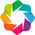

In [62]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

colors = ['#000000']+hv.Cycle('Category20').values

graph = hv.Graph.from_networkx(G, pos)

graph.opts(cmap=colors, node_size=5, edge_line_width=1,
               node_line_color='grey')

bundled = bundle_graph(graph)

hv.extension('bokeh')
hv.output(size=100)
output_file('test.html')
#show(hv.render(bundled))

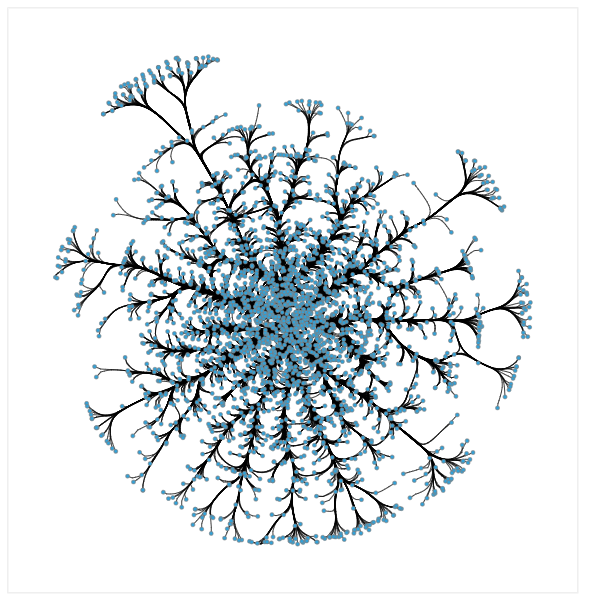

В полученной визуализации граф видно, что большая часть игроков сконцентрирована по центру. Это значит что многие играли с многими. Часть гроздец распложена в удаленности, и они имеют малые связи с основным деревом. Эти игроки либо только начинают свой путь в КХЛ, либо быстро его завершили, так как у них ограниченное количество сокомандников. Так же они могут быть приверженцами одной команды, но скорей всего такие игроки имеют больше связей, так как это не исключает того, что товарищи по команде меняются внутри команды от сезона к сезону.

### Диаграмма Санкей по трансферам игроков <a class="anchor" id="sankey"></a>

In [63]:
def get_source_index(df, source='from_team'):

    """Функция генерации индексов source

    Args:
        df (pd.DataFrame): исходная таблица с признаками step, source, target.
    Returns:
        dict: словарь с индексами, именами и соответсвиями индексов именам source.
    """

    res_dict = {}

    count = 0
    # получаем индексы источников
    for no, step in enumerate(df['step'].unique().tolist()):
        # получаем уникальные наименования для шага
        res_dict[no+1] = {}
        res_dict[no+1]['sources'] = df[df['step'] == step][source].unique().tolist()
        res_dict[no+1]['players'] = df[df['step'] == step]['player'].unique().tolist()
        res_dict[no+1]['sources_index'] = []
        for i in range(len(res_dict[no+1]['sources'])):
            res_dict[no+1]['sources_index'].append(count)
            count += 1

    # соединим списки
    for key in res_dict:
        res_dict[key]['sources_dict'] = {}
        for name, no in zip(res_dict[key]['sources'], res_dict[key]['sources_index']):
            res_dict[key]['sources_dict'][name] = no
    return res_dict

In [64]:
def generate_random_color():

    """Случайная генерация цветов rgba

    Args:

    Returns:
        str: Строка со сгенерированными параметрами цвета
    """

    # сгенерим значение для каждого канала
    r, g, b = np.random.randint(255, size=3)
    return f'rgba({r}, {g}, {b}, 1)'

In [65]:
def colors_for_sources(mode, df, source='from_team'):

    """Генерация цветов rgba

    Args:
        mode (str): сгенерировать случайные цвета, если 'random', а если 'custom' -
                    использовать заранее подготовленные
    Returns:
        dict: словарь с цветами, соответствующими каждому индексу
    """
    # словарь, в который сложим цвета в соответствии с индексом
    colors_dict = {}

    if mode == 'random':
        # генерим случайные цвета
        for label in df[source].unique():
            r, g, b = np.random.randint(255, size=3)
            colors_dict[label] = f'rgba({r}, {g}, {b}, 1)'

    elif mode == 'custom':
        # присваиваем ранее подготовленные цвета
        colors = requests.get('https://raw.githubusercontent.com/rusantsovsv/senkey_tutorial/main/json/colors_senkey.json').json()
        for no, label in enumerate(df[source].unique()):
            colors_dict[label] = colors['custom_colors'][no]

    return colors_dict

In [66]:
def percent_users(sources, targets, values):

    """
    Расчет уникальных id в процентах (для вывода в hover text каждого узла)

    Args:
        sources (list): список с индексами source.
        targets (list): список с индексами target.
        values (list): список с "объемами" потоков.

    Returns:
        list: список с "объемами" потоков в процентах
    """

    # объединим источники и метки и найдем пары
    zip_lists = list(zip(sources, targets, values))

    new_list = []

    # подготовим список словарь с общим объемом трафика в узлах
    unique_dict = {}

    # проходим по каждому узлу
    for source, target, value in zip_lists:
        if source not in unique_dict:
            # находим все источники и считаем общий трафик
            unique_dict[source] = 0
            for sr, tg, vl in zip_lists:
                if sr == source:
                    unique_dict[source] += vl

    # считаем проценты
    for source, target, value in zip_lists:
        new_list.append(round(100 * value / unique_dict[source], 1))

    return new_list

In [67]:
def lists_for_plot(df, source_indexes, colors, st='step', source='from_team', target='to_team', frac=0):

    """
    Создаем необходимые для отрисовки диаграммы переменные списков и возвращаем
    их в виде словаря

    Args:
        source_indexes (dict): словарь с именами и индексами source.
        colors (dict): словарь с цветами source.
        frac (int): ограничение на минимальный "объем" между узлами.

    Returns:
        dict: словарь со списками, необходимыми для диаграммы.
    """

    sources = []
    targets = []
    values = []
    labels = []
    link_color = []
    link_text = []

    # проходим по каждому шагу
    for step in tqdm(sorted(df['step'].unique()), desc='Шаг'):
        if step + 1 not in source_indexes:
            continue

        # получаем индекс источника
        temp_dict_source = source_indexes[step]['sources_dict']

        # получаем индексы цели
        temp_dict_target = source_indexes[step+1]['sources_dict']

        # проходим по каждой возможной паре, считаем количество таких пар
        for s, index_source in tqdm(temp_dict_source.items()):
            for t, index_target in temp_dict_target.items():
                # делаем срез данных и считаем количество id
                temp_df = df[(df[st] == step)&(df[source] == s)&(df[target] == t)]
                value = len(temp_df)
                # проверяем минимальный объем потока и добавляем нужные данные
                if value > frac:
                    sources.append(index_source)
                    targets.append(index_target)
                    values.append(value)
                    # делаем поток прозрачным для лучшего отображения
                    link_color.append(colors[s].replace(', 1)', ', 0.2)'))

    labels = []
    colors_labels = []
    for key in source_indexes:
        for name in source_indexes[key]['sources']:
            labels.append(name)
            colors_labels.append(colors[name])

    # посчитаем проценты всех потоков
    perc_values = percent_users(sources, targets, values)

    # добавим значения процентов для howertext
    link_text = []
    for perc in perc_values:
        link_text.append(f"{perc}%")

    # возвратим словарь с вложенными списками
    return {'sources': sources,
            'targets': targets,
            'values': values,
            'labels': labels,
            'colors_labels': colors_labels,
            'link_color': link_color,
            'link_text': link_text}

In [68]:
def plot_senkey_diagram(title, data_dict, width=2000, height=1000):

    """
    Функция для генерации объекта диаграммы Сенкей

    Args:
        data_dict (dict): словарь со списками данных для построения.

    Returns:
        plotly.graph_objs._figure.Figure: объект изображения.
    """

    fig = go.Figure(data=[go.Sankey(
        domain = dict(
          x = [0,1],
          y = [0,1]
        ),
        orientation = "h",
        valueformat = ".0f",
        node = dict(
          pad=50,
          thickness=15,
          line=dict(color = "black", width = 0.1),
          label=data_dict['labels'],
          color=data_dict['colors_labels'],
          #customdata=data_dict['players'],
          hovertemplate='Всего переходов у команды %{label}: %{value}<extra></extra>'
        ),
        link = dict(
          #arrowlen=15,
          source=data_dict['sources'],
          target=data_dict['targets'],
          value=data_dict['values'],
          label=data_dict['link_text'],
          color=data_dict['link_color'],
          customdata=data_dict['link_text'],
          hovertemplate='Из команды %{source.label}<br />'+
        'в команду %{target.label}<br /> перешло игроков: %{value}'+
        ', что составляет %{customdata}<br />',
      ))])
    fig.update_layout(title_text=title, font_size=10, width=width, height=height)



    # возвращаем объект диаграммы
    return fig


In [69]:
# выберем топ игроков по переходам
top_switchers = season_transfer.groupby('id').agg(
    num_teams=('team', 'count')).sort_values(by='num_teams', ascending=False)[:20].index

In [70]:
top_transfers = season_transfer[
    ['id', 'player', 'date', 'from_team', 'to_team']
].query('id in @top_switchers and from_team == from_team').sort_values(by=['player','date'])

top_transfers

,id,player,date,from_team,to_team
9676,69366,Alexander Lazushin,2017-06-02,Dynamo Moskva,Lada Togliatti
10537,69366,Alexander Lazushin,2018-06-07,Lada Togliatti,Kunlun Red Star
11157,69366,Alexander Lazushin,2019-05-16,Kunlun Red Star,Lokomotiv Yaroslavl
12639,69366,Alexander Lazushin,2020-08-09,Lokomotiv Yaroslavl,Kunlun Red Star
12696,69366,Alexander Lazushin,2020-10-23,Kunlun Red Star,Dinamo Riga
...,...,...,...,...,...
7112,19079,Yevgeni Lapenkov,2015-05-13,HK Sochi,Neftekhimik Nizhnekamsk
7373,19079,Yevgeni Lapenkov,2015-11-03,Neftekhimik Nizhnekamsk,Yugra Khanty-Mansiysk
9304,19079,Yevgeni Lapenkov,2017-05-02,Yugra Khanty-Mansiysk,HK Sochi
10444,19079,Yevgeni Lapenkov,2018-06-07,HK Sochi,Traktor Chelyabinsk


In [71]:
top_transfers['step'] = top_transfers.groupby('id').cumcount() + 1
top_transfers

,id,player,date,from_team,to_team,step
9676,69366,Alexander Lazushin,2017-06-02,Dynamo Moskva,Lada Togliatti,1
10537,69366,Alexander Lazushin,2018-06-07,Lada Togliatti,Kunlun Red Star,2
11157,69366,Alexander Lazushin,2019-05-16,Kunlun Red Star,Lokomotiv Yaroslavl,3
12639,69366,Alexander Lazushin,2020-08-09,Lokomotiv Yaroslavl,Kunlun Red Star,4
12696,69366,Alexander Lazushin,2020-10-23,Kunlun Red Star,Dinamo Riga,5
...,...,...,...,...,...,...
7112,19079,Yevgeni Lapenkov,2015-05-13,HK Sochi,Neftekhimik Nizhnekamsk,5
7373,19079,Yevgeni Lapenkov,2015-11-03,Neftekhimik Nizhnekamsk,Yugra Khanty-Mansiysk,6
9304,19079,Yevgeni Lapenkov,2017-05-02,Yugra Khanty-Mansiysk,HK Sochi,7
10444,19079,Yevgeni Lapenkov,2018-06-07,HK Sochi,Traktor Chelyabinsk,8


In [72]:
# создаем словарь
source_indexes = get_source_index(top_transfers)

In [73]:
# генерим цвета из списка
colors_dict = colors_for_sources(mode='custom', df=top_transfers)

In [74]:
# создаем нужные данные для построения диаграммы
data_for_plot = lists_for_plot(top_transfers, source_indexes, colors_dict)

100%|██████████| 11/11 [00:00<00:00, 120.85it/s]

100%|██████████| 11/11 [00:00<00:00, 215.63it/s]

100%|██████████| 7/7 [00:00<00:00, 368.34it/s]

100%|██████████| 4/4 [00:00<00:00, 666.64it/s]

100%|██████████| 2/2 [00:00<00:00, 666.77it/s]

100%|██████████| 2/2 [00:00<00:00, 999.60it/s]

100%|██████████| 1/1 [00:00<00:00, 999.36it/s]

Шаг: 100%|██████████| 12/12 [00:00<00:00, 22.85it/s]


In [75]:
# сохраняем диаграмму в переменную и выводим ее
senkey_diagram = plot_senkey_diagram('Переходы топ-20 игроков между командами КХЛ', data_for_plot)
#senkey_diagram.show()

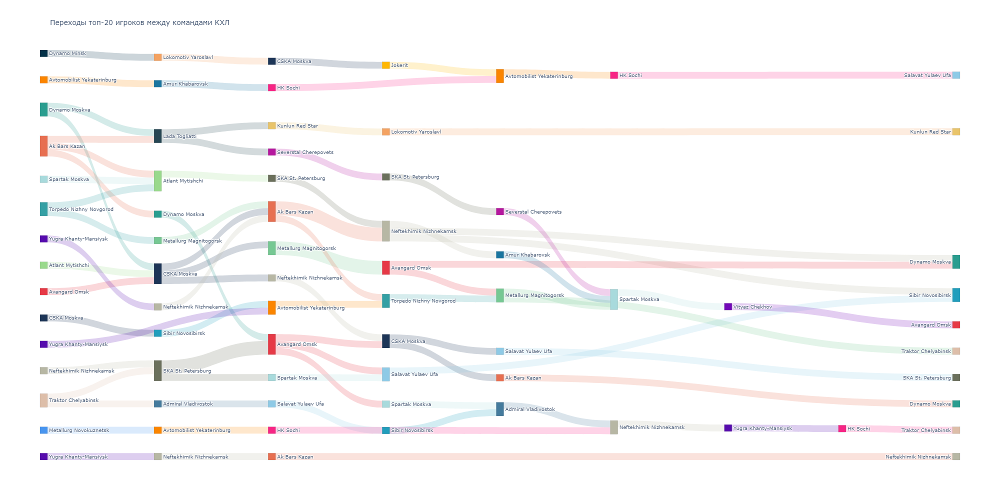

## Гипотезы для проверки <a class="anchor" id="test"></a>

В начале проекта были выдвинуты некоторые гипотезы,

### У Николая Лемтюгова больше всего одноклубников в новейшей российской хоккейной истории.  <a class="anchor" id="new_history"></a>

Ранее мы составили словарь с перечнем игроков и количеством их сокомандников за все время. Выведем топ три игроков этого списка:

In [76]:
top_teammates.head(3)

id_x   player_x         
19079  Yevgeni Lapenkov     529
13646  Gennadi Stolyarov    489
849    Mikhail Zhukov       486
Name: id_y, dtype: int64

Лидером по количеству сокомандников стал Евгений Лапенков. За ним следует Геннадия столяров и Михаил Жуков.
Таким образом **гипотеза не подтвердилась**: Евгений Лапенков стал самым популярным хоккеистом

### Любые два хоккеиста в истории КХЛ могут познакомиться за максимум 6 рукопожатий <a class="anchor" id="six_shakes"></a>

Мы уже знаем, что у игроков, с наибольшим числом сокамандников максимальное число рукопожатий составляет 6. Для того, чтобы проверить максимальное чило у любых хоккеистов стоит проверить игрока с наименьшим количеством сокомандников. Выведем из ранее составленного списка самого нижнего игрока.

In [77]:
top_teammates.tail(1)

id_x    player_x        
326697  Kirill Ustimenko    24
Name: id_y, dtype: int64

In [78]:
distances = calculate_distance(newd, 326697)

In [79]:
# Преобразуем словарь в датафрейм
ustimenko_number = pd.DataFrame.from_dict(distances, orient='index').reset_index().rename(
    columns={'index': 'id', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
ustimenko_number['player'] = ustimenko_number['id'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
ustimenko_number = ustimenko_number[['id', 'player', 'number']]

display(ustimenko_number.sort_values(by='number', ascending=False).head(1))
ustimenko_number['number'].agg(['mean', 'median'])

,id,player,number
0,18,David Printz,3


mean      2.502917
median    3.000000
Name: number, dtype: float64

Несмотря на то, что у Кирилла Уцуменко всего 24 сокомандника, максимальное число, как и медианное, составлет 3. Получается что все игроки КХЛ могут познакомиться максимум за 3 рукопожатия.

### Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше  <a class="anchor" id="max_low"></a>

Поделим игроков на две группы: те, у кого число Лемтюгова равно единице и тех, у кого это число равно двум. Затем расчитаем среднее число по этим когортам и выясним подтвердилась ли гипотеза

In [80]:
low_lemtyugov = lemtyugov_number.query('number == 1')
top_lemtyugov = lemtyugov_number.query('number == 3')

In [81]:
mean_team_low = season_transfer.query('id in @low_lemtyugov["id"]')
mean_team_low = mean_team_low.groupby('player', as_index=False)['team'].nunique()
mean_team_low = round(mean_team_low['team'].agg('mean'),2)
print('Среднее количество команд, в которых играли хоккеисты с низким числом Лемтюгова:', mean_team_low)

mean_team_top = season_transfer.query('id in @top_lemtyugov["id"]')
mean_team_top = mean_team_top.groupby('player', as_index=False)['team'].nunique()
mean_team_top =  round(mean_team_top['team'].agg('mean'),2)
print('Среднее количество команд, в которых играли хоккеисты с высоким числом Лемтюгова:', mean_team_top)

if mean_team_top < mean_team_low:
    print('Гипотеза подтвердилась: Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше')
else:
    print('Гипотеза не подтвердилась')

Среднее количество команд, в которых играли хоккеисты с низким числом Лемтюгова: 3.95
Среднее количество команд, в которых играли хоккеисты с высоким числом Лемтюгова: 1.02
Гипотеза подтвердилась: Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше


### Нет игроков, у которых отсутствует число Лемтюгова <a class="anchor" id="no_lem"></a>

У нас есть перечень игроков, игравших в КХЛ. Чтобы ответить на этот вопрос проверим сколько людей из этого перечня отсутствуют в списке игроков с Числом Лемтюгова

In [82]:
print('Количество игроков, без числа Лемтюгова',len(khl_players.query('id not in @lemtyugov_number["id"]')))

Количество игроков, без числа Лемтюгова 0


**Гипотеза подтвердилась:** Нет игроков, у которых отсутсвует число Лемтюгова

### У хоккеистов из северных городов карьера сложилась более успешно, чем у южан <a class="anchor" id="north_south"></a>

Создадим отдельный датафейм с местом рождения игроков и загрузим таблицу с российскими городами и георгафическими координатами для создания карты успешности. Критерии успешности определим поздее

PS. В КХЛ присутствует много легионеров из разных стран. Но так как нас интересует вопрос долготы, отдельные игроки из разных стран только собьют статистику  

In [83]:
personal_nation = personal.copy()
personal_nation = personal_nation[['id','player_name','place_of_birth','nation']]

In [84]:
personal_nation[['place_of_birth', 'iso']] = personal_nation['place_of_birth']. str.split(',', 1 , expand= True )
personal_nation = personal_nation.rename(columns={'place_of_birth': 'city', 'player_name': 'player'})
personal_nation

C:\Users\user Anya\AppData\Local\Temp\ipykernel_22220\613501058.py:1: FutureWarning:

In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.



,id,player,city,nation,iso
0,19555,Sergei Belov,St. Petersburg,Russia,RUS
1,47547,Rafael Khakimov,Ufa,Russia,RUS
2,11990,Vadim Tarasov,Ust-Kamenogorsk,Russia\n \n / \n Kaza...,KAZ
3,12286,Alexander Yeryomenko,Moskva,Russia,RUS
4,8421,Miroslav Blatak,Zlin,Czechia,CZE
...,...,...,...,...,...
3594,595716,Yegor Sobolevsky,St. Petersburg,Russia,RUS
3595,649445,Roman Yuzbashyan,Lipetsk,Russia,RUS
3596,418542,Sergei Popov,Korolyov,Russia,RUS
3597,561884,Dmitri Utkin,Solnechnogorsk,Russia,RUS


In [85]:
# Файл взят по ссылке: https://simplemaps.com/data/ru-cities

#ru_cities = pd.read_csv('ru.csv')

#Код ревьюера - меняю ссылку на свою
ru_cities = pd.read_csv('https://drive.google.com/uc?id=1XUP6i4PGk8rqEw2RIXv-RAWVa_iQZnpA')

ru_cities = ru_cities[['city', 'lat', 'lng', 'admin_name']]
ru_cities

,city,lat,lng,admin_name
0,Moscow,55.7558,37.6178,Moskva
1,Saint Petersburg,59.9500,30.3167,Sankt-Peterburg
2,Novosibirsk,55.0333,82.9167,Novosibirskaya Oblast’
3,Yekaterinburg,56.8356,60.6128,Sverdlovskaya Oblast’
4,Nizhniy Novgorod,56.3269,44.0075,Nizhegorodskaya Oblast’
...,...,...,...,...
230,Solyanka,46.3889,48.0175,Astrakhanskaya Oblast’
231,Timofeyevka,53.5633,49.3893,Samarskaya Oblast’
232,Belaya Rechka,43.4381,43.5350,Kabardino-Balkariya
233,Dzerzhinskoye,56.5183,84.8369,Tomskaya Oblast’


In [86]:
#translation = pd.read_csv('cities_ru_en.csv')

#Код ревьюера - меняю ссылку на свою
translation = pd.read_csv('https://drive.google.com/uc?id=1xzctWBW91cwRlsZgjDcOGiCxicDEOKYA')

translation = translation.rename(columns={'Abaza': 'city','Абаза': 'city_ru'})
translation

,city_ru,city
0,Абакан,Abakan
1,Абан,Aban
2,Абатский,Abatski
3,Абдулино,Abdulino
4,Абезь,Abez
...,...,...
2163,Яхрома,Yakhroma
2164,Яшалта,Yashalta
2165,Яшкино,Yashkino
2166,Яшкуль,Yashkul


In [87]:
#translation_region = pd.read_excel('koord_lat_lng_russia.xlsx')

#Код ревьюера - меняю ссылку на свою
translation_region = pd.read_excel('https://drive.google.com/uc?id=1reUzFt9yE-eLx2O6mogt9eBNW58ZxfnL')

translation_region = translation_region.rename(columns={'Город': 'city_ru','Регион':'name'})
translation_region = translation_region[['city_ru', 'name']]
translation_region

,city_ru,name
0,Абаза,Хакасия
1,Абакан,Хакасия
2,Абдулино,Оренбургская область
3,Абинск,Краснодарский край
4,Агидель,Башкортостан
...,...,...
1077,Ярославль,Ярославская область
1078,Ярцево,Смоленская область
1079,Ясногорск,Тульская область
1080,Ясный,Оренбургская область


In [88]:
ru_cities = pd.merge(ru_cities, translation,on=['city'], how='inner').reset_index(drop=True)
ru_cities

,city,lat,lng,admin_name,city_ru
0,Moscow,55.7558,37.6178,Moskva,Москва
1,Saint Petersburg,59.9500,30.3167,Sankt-Peterburg,Санкт-Петербург
2,Novosibirsk,55.0333,82.9167,Novosibirskaya Oblast’,Новосибирск
3,Yekaterinburg,56.8356,60.6128,Sverdlovskaya Oblast’,Екатеринбург
4,Nizhniy Novgorod,56.3269,44.0075,Nizhegorodskaya Oblast’,Нижний Новгород
...,...,...,...,...,...
198,Kraskovo,55.6586,37.9869,Moskovskaya Oblast’,Красково
199,Karachayevsk,43.7731,41.9169,Karachayevo-Cherkesiya,Карачаевск
200,Kozmodemyansk,56.3367,46.5711,Mariy-El,Козьмодемьянск
201,Kirsanov,52.6500,42.7333,Tambovskaya Oblast’,Кирсанов


In [89]:
ru_regions = pd.merge(ru_cities, translation_region,on=['city_ru'], how='inner').reset_index(drop=True)
ru_regions

,city,lat,lng,admin_name,city_ru,name
0,Moscow,55.7558,37.6178,Moskva,Москва,Москва
1,Saint Petersburg,59.9500,30.3167,Sankt-Peterburg,Санкт-Петербург,Санкт-Петербург
2,Novosibirsk,55.0333,82.9167,Novosibirskaya Oblast’,Новосибирск,Новосибирская область
3,Yekaterinburg,56.8356,60.6128,Sverdlovskaya Oblast’,Екатеринбург,Свердловская область
4,Kazan,55.7964,49.1089,Tatarstan,Казань,Татарстан
...,...,...,...,...,...,...
189,Losino-Petrovskiy,55.8744,38.2017,Moskovskaya Oblast’,Лосино-Петровский,Московская область
190,Karachayevsk,43.7731,41.9169,Karachayevo-Cherkesiya,Карачаевск,Карачаево-Черкесия
191,Kozmodemyansk,56.3367,46.5711,Mariy-El,Козьмодемьянск,Марий Эл
192,Kirsanov,52.6500,42.7333,Tambovskaya Oblast’,Кирсанов,Тамбовская область


In [90]:
personal_nation.head(1)

,id,player,city,nation,iso
0,19555,Sergei Belov,St. Petersburg,Russia,RUS


In [91]:
nation = pd.merge(personal_nation, ru_regions, on=['city'], how='inner').reset_index(drop=True)
nation

,id,player,city,nation,iso,lat,lng,admin_name,city_ru,name
0,47547,Rafael Khakimov,Ufa,Russia,RUS,54.7261,55.9475,Bashkortostan,Уфа,Башкортостан
1,15169,Pavel Doronin,Ufa,Russia,RUS,54.7261,55.9475,Bashkortostan,Уфа,Башкортостан
2,19400,Vyacheslav Seluyanov,Ufa,Russia,RUS,54.7261,55.9475,Bashkortostan,Уфа,Башкортостан
3,24788,Pavel Volodin,Ufa,Russia\n \n / \n Kaza...,RUS,54.7261,55.9475,Bashkortostan,Уфа,Башкортостан
4,24789,Yegor Dubrovsky,Ufa,Russia,RUS,54.7261,55.9475,Bashkortostan,Уфа,Башкортостан
...,...,...,...,...,...,...,...,...,...,...
1176,526255,Ivan Miroshnichenko,Ussuriysk,Russia,RUS,43.8000,131.9667,Primorskiy Kray,Уссурийск,Приморский край
1177,595475,Nikita Smirnov,Kuznetsk,Russia,RUS,53.1167,46.6000,Penzenskaya Oblast’,Кузнецк,Пензенская область
1178,568036,Yegor Guskov,Tula,Russia,RUS,54.2000,37.6167,Tul’skaya Oblast’,Тула,Тульская область
1179,698862,Nikita Blednov,Dzerzhinsk,Russia,RUS,56.2333,43.4500,Nizhegorodskaya Oblast’,Дзержинск,Нижегородская область


In [92]:
top_cities = nation.groupby(['city_ru','city','name','admin_name','lat', 'lng'], as_index=False)['id'].agg('count')
top_cities = top_cities.rename(columns={'id': 'count'})
top_cities.sort_values(by = 'count', ascending = False)

,city_ru,city,name,admin_name,lat,lng,count
82,Челябинск,Chelyabinsk,Челябинская область,Chelyabinskaya Oblast’,55.1500,61.4000,144
89,Ярославль,Yaroslavl,Ярославская область,Yaroslavskaya Oblast’,57.6167,39.8500,83
41,Магнитогорск,Magnitogorsk,Челябинская область,Chelyabinskaya Oblast’,53.3833,59.0333,70
54,Омск,Omsk,Омская область,Omskaya Oblast’,54.9667,73.3833,67
15,Екатеринбург,Yekaterinburg,Свердловская область,Sverdlovskaya Oblast’,56.8356,60.6128,63
...,...,...,...,...,...,...,...
16,Златоуст,Zlatoust,Челябинская область,Chelyabinskaya Oblast’,55.1667,59.6667,1
40,Люберцы,Lyubertsy,Московская область,Moskovskaya Oblast’,55.6783,37.8944,1
33,Краснознаменск,Krasnoznamensk,Калининградская область,Moskovskaya Oblast’,55.6008,37.0358,1
36,Кузнецк,Kuznetsk,Пензенская область,Penzenskaya Oblast’,53.1167,46.6000,1


In [93]:
#state_geo = gpd.read_file('russia-with-regions_1507.geojson')

#Код ревьюера - меняю ссылку на свою
state_geo = gpd.read_file('https://drive.google.com/uc?id=1V5IY72PUNqBvrEQtSk9f0FKviRIzJpjm')

state_geo

,id,name,density,path,geometry
0,5491,Адыгея,0,/world/Russia/Адыгея,"POLYGON ((38.68402 44.95141, 38.68591 45.03916..."
1,5523,Алтай,0,/world/Russia/Алтай,"POLYGON ((87.13270 52.61759, 87.13416 52.60661..."
2,5477,Алтайский край,0,/world/Russia/Алтайский край,"POLYGON ((85.11687 54.43779, 85.15997 54.45263..."
3,5538,Амурская область,0,/world/Russia/Амурская область,"POLYGON ((119.85614 56.89608, 119.90785 56.908..."
4,5518,Архангельская область,0,/world/Russia/Архангельская область,"MULTIPOLYGON (((37.90677 63.99368, 37.89757 63..."
...,...,...,...,...,...
78,5531,Чеченская республика,0,/world/Russia/Чеченская республика,"POLYGON ((44.83243 43.68196, 44.85334 43.69553..."
79,5511,Чувашия,0,/world/Russia/Чувашия,"MULTIPOLYGON (((48.05063 54.98909, 48.05238 55..."
80,5483,Чукотский автономный округ,0,/world/Russia/Чукотский автономный округ,"MULTIPOLYGON (((187.34198 64.59757, 187.32095 ..."
81,5525,Ямало-Ненецкий автономный округ,0,/world/Russia/Ямало-Ненецкий автономный округ,"MULTIPOLYGON (((71.63600 66.90468, 71.65268 66..."


In [94]:
geo_id = state_geo[['id', 'name']]
top = pd.merge(top_cities, geo_id, on=['name'], how='inner').reset_index(drop=True)
top.query('id == "5543"')

,city_ru,city,name,admin_name,lat,lng,count,id
69,Рыбинск,Rybinsk,Ярославская область,Yaroslavskaya Oblast’,58.0500,38.8333,10,5543
70,Ярославль,Yaroslavl,Ярославская область,Yaroslavskaya Oblast’,57.6167,39.8500,83,5543


In [95]:
rating_df = top.groupby(['id','name'], as_index=False)['count'].agg('sum')
rating_df.sort_values(by='count', ascending = False).head(3)

,id,name,count
47,5547,Челябинская область,218
45,5543,Ярославская область,93
18,5500,Татарстан,82


In [96]:
import plotly.io as pio 
pio.renderers.default = "png" 
svg_renderer = pio.renderers["png"] 
svg_renderer.scale = 1.2

In [97]:
#Код ревьюера - рабочий вариант, добавляем уровень properties в ключ
# загружаем JSON-файл с границами округов Москвы
#state_geo = 'russia-with-regions_1507.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 60.000000, 40.000000

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=3)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Плотность хоккеистов, родившихся в регионе',
).add_to(m)

# выводим карту
m

### Критерии успешности

Так как нас интересует лига КХЛ, то за критерий успешности возьмем количество отыгранных сезонов и наград, присуждаемые в рамках лиги. Мы ограничиваемся этой информацией, так как некоторые игроки могли перейти в другие хоккейные лиги на ранних этапах и добиваться больших успехов там, но информации о них у нас нет. Та же история с наградами: датасет содержит инфорацию про все награды за всю карьеру хоккеиста. Они так же могли быть получены вне Контенинтальной Хокккейной Лиги и если мы будем учитывать их все, это может повлиять на общую оценку успешности

In [98]:
khl_award = personal.copy()
khl_award = khl_award.rename(columns={'player_name': 'player'})
khl_award['awards'] = khl_award['awards'].str.split(',')
khl_award = khl_award.explode('awards')
khl_award.head(3)

,player,date_of_birth,position,age,place_of_birth,nation,grip,youth_team,height_cm,height_ft,weight_kg,weight_lbs,awards,player_link,id
0,Sergei Belov,1982-09-27,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"{""2009-2010"": [""Russia2 Silver Medal""]",https://www.eliteprospects.com/player/19555/se...,19555
0,Sergei Belov,1982-09-27,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"""2013-2014"": [""VHL Silver Medal""]}",https://www.eliteprospects.com/player/19555/se...,19555
1,Rafael Khakimov,1990-04-06,G,33,"Ufa, RUS",Russia,L,Salavat Yulaev Ufa,180,"5'11""",78,172 lbs,"{""2010-2011"": [""MHL All-Star Game""",https://www.eliteprospects.com/player/47547/ra...,47547


In [99]:
#Разделим даные по годам, чтобы была возможность дать некторым наградам больше баллов
khl_award['awards']=khl_award['awards'].str.split(':')
khl_award = khl_award.explode('awards')
khl_award.head(3)

,player,date_of_birth,position,age,place_of_birth,nation,grip,youth_team,height_cm,height_ft,weight_kg,weight_lbs,awards,player_link,id
0,Sergei Belov,1982-09-27,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"{""2009-2010""",https://www.eliteprospects.com/player/19555/se...,19555
0,Sergei Belov,1982-09-27,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"[""Russia2 Silver Medal""]",https://www.eliteprospects.com/player/19555/se...,19555
0,Sergei Belov,1982-09-27,G,40,"St. Petersburg, RUS",Russia,L,SKA St. Petersburg,180,"5'11""",78,172 lbs,"""2013-2014""",https://www.eliteprospects.com/player/19555/se...,19555


In [100]:
# Оставим только награды  чемпионатов КХЛ
khl_award['khl_award'] = khl_award['awards'].str.contains('KHL ', regex=False)
khl_award = khl_award.query('khl_award == True').reset_index(drop=True)
khl_award.head()

,player,date_of_birth,position,age,place_of_birth,nation,grip,youth_team,height_cm,height_ft,weight_kg,weight_lbs,awards,player_link,id,khl_award
0,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL All-Star Game""",https://www.eliteprospects.com/player/12286/al...,12286,True
1,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL Goaltender of the Month (September)""",https://www.eliteprospects.com/player/12286/al...,12286,True
2,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Gagarin Cup Champion""]",https://www.eliteprospects.com/player/12286/al...,12286,True
3,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Best Goaltender""",https://www.eliteprospects.com/player/12286/al...,12286,True
4,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL First All-Star Team""",https://www.eliteprospects.com/player/12286/al...,12286,True


Таблица с данными по полученным наградам внутри КХЛ готова. Отдельно выделим чемпионов, получивших Кубок Гагарина и присловим им дополнительные 5 баллов успешности.

In [101]:
khl_award['champion'] = khl_award['awards'].str.contains('Gagarin Cup Champion', regex=False)

In [102]:
khl_award.head()

,player,date_of_birth,position,age,place_of_birth,nation,grip,youth_team,height_cm,height_ft,weight_kg,weight_lbs,awards,player_link,id,khl_award,champion
0,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL All-Star Game""",https://www.eliteprospects.com/player/12286/al...,12286,True,False
1,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL Goaltender of the Month (September)""",https://www.eliteprospects.com/player/12286/al...,12286,True,False
2,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Gagarin Cup Champion""]",https://www.eliteprospects.com/player/12286/al...,12286,True,True
3,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Best Goaltender""",https://www.eliteprospects.com/player/12286/al...,12286,True,False
4,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL First All-Star Team""",https://www.eliteprospects.com/player/12286/al...,12286,True,False


In [103]:
def bonus(x):
    if x is True:
        return 5
    else:
        return 0

khl_award['bonus'] = khl_award['champion'].apply(bonus)
khl_award.head()

,player,date_of_birth,position,age,place_of_birth,nation,grip,youth_team,height_cm,height_ft,weight_kg,weight_lbs,awards,player_link,id,khl_award,champion,bonus
0,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL All-Star Game""",https://www.eliteprospects.com/player/12286/al...,12286,True,False,0
1,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL Goaltender of the Month (September)""",https://www.eliteprospects.com/player/12286/al...,12286,True,False,0
2,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Gagarin Cup Champion""]",https://www.eliteprospects.com/player/12286/al...,12286,True,True,5
3,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"[""KHL Best Goaltender""",https://www.eliteprospects.com/player/12286/al...,12286,True,False,0
4,Alexander Yeryomenko,1980-04-10,G,43,"Moskva, RUS",Russia,L,Dynamo Moskva,180,"5'11""",78,172 lbs,"""KHL First All-Star Team""",https://www.eliteprospects.com/player/12286/al...,12286,True,False,0


Создадим датасет, который будет содержать только важную для дальшейшей части задания информацию

In [104]:
awarded_players = khl_award.copy()
awarded_players = awarded_players[
    ['player','id','date_of_birth','place_of_birth','awards', 'champion', 'bonus']
]
awarded_players

,player,id,date_of_birth,place_of_birth,awards,champion,bonus
0,Alexander Yeryomenko,12286,1980-04-10,"Moskva, RUS","[""KHL All-Star Game""",False,0
1,Alexander Yeryomenko,12286,1980-04-10,"Moskva, RUS","""KHL Goaltender of the Month (September)""",False,0
2,Alexander Yeryomenko,12286,1980-04-10,"Moskva, RUS","[""KHL Gagarin Cup Champion""]",True,5
3,Alexander Yeryomenko,12286,1980-04-10,"Moskva, RUS","[""KHL Best Goaltender""",False,0
4,Alexander Yeryomenko,12286,1980-04-10,"Moskva, RUS","""KHL First All-Star Team""",False,0
...,...,...,...,...,...,...,...
2610,Vadim Moroz,650741,2003-11-20,"Minsk, BLR","""KHL Rookie of the Week (Nov. 14)""]}",False,0
2611,Daniil Orlov,665898,2003-12-21,"Elektrostal, RUS","[""KHL Rookie of the Week (Oct. 24)""",False,0
2612,Daniel Usmanov,663596,2002-04-15,"Mytishchi, RUS","[""KHL Rookie of the Week (Jan. 23)""",False,0
2613,German Tochilkin,699318,2003-09-24,"Orsk, RUS","[""KHL Rookie of the Week (Feb. 6)""]}",False,0


Посчитаем показатели успешности, расчитанные следующими баллами:
* участие в сезоне - 0,25 балла;
* наличие наград - 1 балл;
* получение кудка гагарина - 5 баллов;

In [105]:
players_aword_count = awarded_players.groupby(['id','player'], as_index=False)['awards'].count()
display(players_aword_count.sort_values(by='awards', ascending = False).head(3))
print('Среднее значение по полученным наградам',players_aword_count['awards'].mean())

,id,player,awards
334,14828,Sergei Mozyakin,75
133,8794,Alexander Radulov,38
297,12286,Alexander Yeryomenko,32


Среднее значение по полученным наградам 3.165859564164649


In [106]:
players_bonus_count = awarded_players.groupby(['id','player'], as_index=False)['bonus'].sum()
display(players_bonus_count.sort_values(by='bonus', ascending = False).head(3))
print('Среднее значение по выигранным сезонам',players_bonus_count['bonus'].mean())

,id,player,bonus
240,11045,Danis Zaripov,25
267,11858,Maxim Chudinov,15
318,13965,Ilya Kablukov,15


Среднее значение по выигранным сезонам 2.2154963680387407


In [107]:
total_seasons = season_transfer.groupby(['id','player'], as_index=False)['season'].nunique()
total_seasons['bonus_2'] = total_seasons['season'] * 0.25
display(total_seasons.sort_values(by = 'season', ascending = False).head(3))
print('Среднее значение по отыгранным сезонам',total_seasons['bonus_2'].mean())

,id,player,season,bonus_2
1589,24633,Roman Starchenko,15,3.75
1069,17825,Yakov Rylov,15,3.75
1656,30520,Pyotr Khokhryakov,15,3.75


Среднее значение по отыгранным сезонам 0.9190052792442345


Объединим три полученные таблицы, заполним пропуски и посчитаем итоговый балл успешности. Дополнительно выведем пять самых успешных хоккеистов по такому рейтингу КХЛ

In [108]:
seccess_rate = pd.merge(total_seasons, players_bonus_count, on=['id','player'], how='outer').reset_index(drop=True)
seccess_rate = pd.merge(seccess_rate, players_aword_count, on=['id','player'], how='outer').reset_index(drop=True)
seccess_rate = seccess_rate.fillna(0)
seccess_rate['total_seccess'] = seccess_rate['bonus_2'] + seccess_rate['bonus'] + seccess_rate['awards']
seccess_rate.sort_values(by='total_seccess', ascending = False).head(5)

,id,player,season,bonus_2,bonus,awards,total_seccess
925,14828,Sergei Mozyakin,13,3.25,10.0,75.0,88.25
659,11045,Danis Zaripov,14,3.50,25.0,31.0,59.50
803,12286,Alexander Yeryomenko,14,3.50,15.0,32.0,50.50
1322,19550,Vadim Shipachyov,15,3.75,10.0,32.0,45.75
359,8794,Alexander Radulov,9,2.25,5.0,38.0,45.25


In [109]:
# Ограничем таблицу для дальнейшего объединеня с нужными таблицами для дальнейших гипотез
players_seccess_rate = seccess_rate.copy()
players_seccess_rate = players_seccess_rate[['id', 'player', 'total_seccess']]
players_seccess_rate

,id,player,total_seccess
0,18,David Printz,0.25
1,30,Andreas Jämtin,0.25
2,41,Adam Masuhr,0.50
3,59,Tony Mårtensson,19.50
4,65,Sergejs Naumovs,0.25
...,...,...,...
3594,707284,Alexander Pelevin,0.25
3595,708561,Timur Mukhanov,0.25
3596,708989,Maxim Zinchenko,0.25
3597,709006,Artyom Kashtanov,0.25


In [110]:
seccess_nation = pd.merge(players_seccess_rate, nation, on=['id','player'], how='inner').reset_index(drop=True)
seccess_nation

,id,player,total_seccess,city,nation,iso,lat,lng,admin_name,city_ru,name
0,2627,Kirill Starkov,0.25,Yekaterinburg,Denmark\n \n / \n Russia,RUS,56.8356,60.6128,Sverdlovskaya Oblast’,Екатеринбург,Свердловская область
1,3660,Ilya Kovalchuk,35.75,Tver,Russia,RUS,56.8578,35.9219,Tverskaya Oblast’,Тверь,Тверская область
2,3662,Alexander Svitov,17.00,Omsk,Russia,RUS,54.9667,73.3833,Omskaya Oblast’,Омск,Омская область
3,4231,Yevgeni Malkin,2.25,Magnitogorsk,Russia\n \n / \n USA,RUS,53.3833,59.0333,Chelyabinskaya Oblast’,Магнитогорск,Челябинская область
4,8520,Stanislav Chistov,3.50,Chelyabinsk,Russia,RUS,55.1500,61.4000,Chelyabinskaya Oblast’,Челябинск,Челябинская область
...,...,...,...,...,...,...,...,...,...,...,...
1176,700155,Ilya Fedotov,0.75,Saratov,Russia,RUS,51.5333,46.0167,Saratovskaya Oblast’,Саратов,Саратовская область
1177,700344,Vladimir Tabatchikov,0.25,Novosibirsk,Russia,RUS,55.0333,82.9167,Novosibirskaya Oblast’,Новосибирск,Новосибирская область
1178,707283,Sergei Murashov,0.25,Yaroslavl,Russia,RUS,57.6167,39.8500,Yaroslavskaya Oblast’,Ярославль,Ярославская область
1179,708989,Maxim Zinchenko,0.25,Yekaterinburg,Russia,RUS,56.8356,60.6128,Sverdlovskaya Oblast’,Екатеринбург,Свердловская область


Посчитаем суммарные, средние, нормализированные и релятивные показатели по областям 

In [111]:
#Код ревьюера - считаем агрегированные покзатели
per_player = seccess_nation.groupby(['name'], as_index=False).agg(
    num_players=('total_seccess', 'count'),
    sum_points=('total_seccess', 'sum'),
    mean_points=('total_seccess', 'mean')
)
#Нормализуем количество игроков, чтобы один игрок не перевешивал (https://www.codecamp.ru/blog/normalize-columns-pandas-dataframe/)
per_player['num_players_norm'] = (per_player['num_players'] - per_player['num_players'].mean ()) / per_player['num_players'].std()

#Умножаем средние очки на нормализованное число игроков
per_player['relative'] = per_player['mean_points'] * per_player['num_players_norm']
per_player.sort_values(by = 'relative', ascending = False).head(20)

,name,num_players,sum_points,mean_points,num_players_norm,relative
48,Челябинская область,218,713.75,3.274083,5.451863,17.849851
52,Ярославская область,93,279.75,3.008065,1.969882,5.925532
40,Татарстан,82,208.50,2.542683,1.663467,4.229670
25,Омская область,67,176.50,2.634328,1.245630,3.281397
36,Свердловская область,63,132.00,2.095238,1.134206,2.376432
5,Вологодская область,42,171.50,4.083333,0.549233,2.242703
12,Кемеровская область,56,122.25,2.183036,0.939215,2.050340
2,Башкортостан,65,107.50,1.653846,1.189918,1.967941
21,Московская область,59,106.00,1.796610,1.022783,1.837542
46,Хабаровский край,46,95.50,2.076087,0.660657,1.371581


In [112]:
# Код ревьюера - строим по датафрейму с нормализацией
#state_geo = 'russia-with-regions_1507.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 60.000000, 40.000000

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=3)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= per_player,
    columns=['name', 'relative'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Регионы с наиболее успешными игроками',
).add_to(m)

# выводим карту
m

Как видно на карте, северные регионы России не сильно выделяются на карте. Следовательно гипотеза не подтвердилась  

### Более успешные хоккеисты рождаются в январе-марте <a class="anchor" id="birthday"></a>

Ранее мы сделали датафрей с суммарным балом успешности хоккеистов. Сделаем таблицу с датами рождения и выделим из них месяц. Далее объединим ее с "успешностью" и посчитаем среднее значением и посчитаем среднее по месяцам

In [113]:
birthday = personal.copy()
birthday = birthday[['id', 'player_name', 'date_of_birth']]
birthday = birthday.rename(columns={'player_name': 'player'})
birthday

,id,player,date_of_birth
0,19555,Sergei Belov,1982-09-27
1,47547,Rafael Khakimov,1990-04-06
2,11990,Vadim Tarasov,1976-12-31
3,12286,Alexander Yeryomenko,1980-04-10
4,8421,Miroslav Blatak,1982-05-25
...,...,...,...
3594,595716,Yegor Sobolevsky,2002-04-07
3595,649445,Roman Yuzbashyan,2002-07-13
3596,418542,Sergei Popov,2000-03-27
3597,561884,Dmitri Utkin,2002-09-18


In [114]:
birthday['month'] = birthday['date_of_birth'].dt.month
birthday

,id,player,date_of_birth,month
0,19555,Sergei Belov,1982-09-27,9
1,47547,Rafael Khakimov,1990-04-06,4
2,11990,Vadim Tarasov,1976-12-31,12
3,12286,Alexander Yeryomenko,1980-04-10,4
4,8421,Miroslav Blatak,1982-05-25,5
...,...,...,...,...
3594,595716,Yegor Sobolevsky,2002-04-07,4
3595,649445,Roman Yuzbashyan,2002-07-13,7
3596,418542,Sergei Popov,2000-03-27,3
3597,561884,Dmitri Utkin,2002-09-18,9


In [115]:
birthday_seccess_rate = pd.merge(
    birthday, players_seccess_rate, on=['id','player'], how='outer').reset_index(drop=True)
birthday_seccess_rate

,id,player,date_of_birth,month,total_seccess
0,19555,Sergei Belov,1982-09-27,9,0.50
1,47547,Rafael Khakimov,1990-04-06,4,1.25
2,11990,Vadim Tarasov,1976-12-31,12,1.25
3,12286,Alexander Yeryomenko,1980-04-10,4,50.50
4,8421,Miroslav Blatak,1982-05-25,5,9.00
...,...,...,...,...,...
3594,595716,Yegor Sobolevsky,2002-04-07,4,0.25
3595,649445,Roman Yuzbashyan,2002-07-13,7,0.25
3596,418542,Sergei Popov,2000-03-27,3,1.25
3597,561884,Dmitri Utkin,2002-09-18,9,0.25


In [116]:
month_seccess_rate = birthday_seccess_rate.groupby(['month'], as_index=False)['total_seccess'].mean()

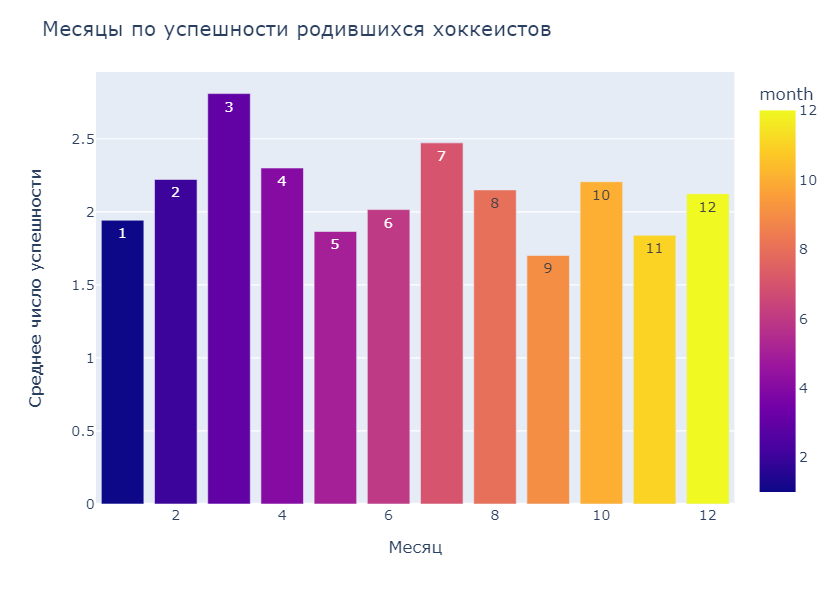

In [117]:
fig = px.bar(month_seccess_rate, y='total_seccess', x='month', text='month', color='month')
# оформляем график
fig.update_layout(title='Месяцы по успешности родившихся хоккеистов',
                   xaxis_title='Месяц',
                   yaxis_title='Среднее число успешности')
fig.show() # выводим график

В марте действительно рождаются наиболее успешные хоккеисты. Но Январь и Февраль находятся на уровне других месяцев. Наименее успешные хоккеисты рождаются в Сентябре

## Заключение <a class="anchor" id="final"></a>

Для исследования было предоставлены данные о игроах, трансферах, статистиках и сезонах. В ходе работы в датасетах заголовки были приведены к нижнему регистру и даты приведены к нужному типу

Из имеющихся таблиц была составлена рабочая таблица, которая содержала даты старта и конца сезонов, id игроков и данные по всем сезонам и переходам в одном.

Было рассчитано число Лемтюгова, путем расчета граф и дистанций от нулевой точки до каждого возможного игрока из датасета. Дополнительно к этому, графы были визуализированы с помощью библиотека holoviews и на основании визуализации был сделан вывод, что внутри КХЛ многие игроки играли со многими. Помимо этого, была сформирована диаграмма Санкей по командам с топ-20 трансферами между командами

Были даны ответы по гипотезам, определенным в начале исследования. Выводы следующие:

* Николай Лемтюгов не является игроком с самым большим количеством сокомандников. Им стал **Евгений Лапенков** (529 сокомандников)
* Все игроки КХЛ могут познакомиться максимум за 3 рукопожатия.
* Игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше
* Нет игроков, у которых отсутсвует число Лемтюгова
* Регионом, в котором самый высокий показатель успешности в КХЛ стал **Краснодарский край (14 баллов в среднем)**. На втором и третем месте расположились Псковская область (5 баллов) и Красноярский край (4,125 баллов). Эти регионы сложно назвать северными, поэтому нет оснований полагать, что хоккеисты, родившиеся в северных регионах стали успешней
* В марте действительно рождаются наиболее успешные хоккеисты (средний покащатель больше 2,5).

